# Steepest descent and conjugate gradient in Python

In [190]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
plt.style.use('_mpl-gallery-nogrid')
plt.rcParams['text.usetex'] = True
plt.rcParams['figure.figsize'] = (9,9)
plt.rcParams['savefig.dpi'] = 600
plt.rcParams['figure.dpi'] = 600

## 一个经典例子

$$
A=\begin{bmatrix}
3 &2\\
2 &6
\end{bmatrix},
b=\begin{bmatrix}
2\\
-8
\end{bmatrix}
$$

求解
$$Ax=b$$

算例，来至[无痛CG算法](https://www.cs.cmu.edu/~quake-papers/painless-conjugate-gradient.pdf)，本质上还是有痛的！

### 常规计算

In [191]:
A = np.array([[3,2],[2,6]])
b = np.array([[2],[-8]])

In [192]:
x = np.linalg.solve(A, b)
x.T @ A @ x * 0.5

array([[10.]])

## Method of Steepest Descent(MSD)
### 将要求解的𝐴𝑥=𝑏的问题转化为优化问题

经典算例

$$\tag{1}f(x_1,x_2)=\dfrac{3}{2}x_1^2+2x_1x_2+3x_2^2-2x_1+8x_2+c$$

假设$c=4$，可以画出函数的等高线

In [193]:
def plot_contour(A, b, c, x1min, x1max, x2min, x2max, size=20):
    x, y = np.meshgrid(np.linspace(x1min, x1max, size), np.linspace(x2min, x2max, size))
    z = 1.5*x**2 + 2*x*y + 3*y**2 - 2*x + 8*y + c
    
    levels = np.arange(0, np.max(z), 20)
    
    fig, ax = plt.subplots()
    CS = ax.contour(x, y, z, levels=levels) # 等高线图
    ax.clabel(CS, levels, inline=True, fontsize=16) # 标注
    ax.set_title(r'$f(x_1,x_2)$', size=20) # 图名
    ax.tick_params(axis='both', which='major', labelsize=20) # x,y轴坐标大小
    


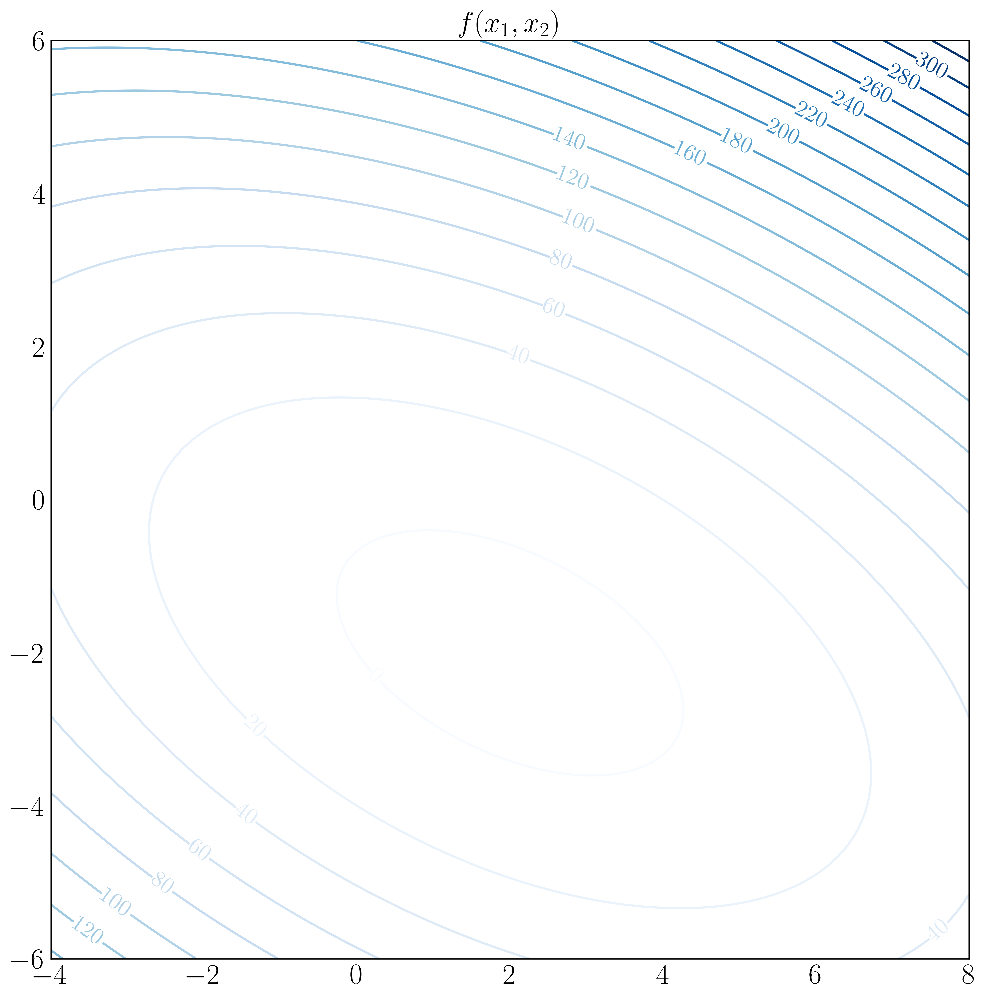

In [194]:
plot_contour(A, b, 4, -4, 8, -6, 6, 100)

### 最速度下降算法推导
对公式`1`求梯度，向量值函数$f(x)=\dfrac{1}{2}x'Ax+b'x+c$

$$
\tag{2}
\dfrac{\partial{f}}{\partial{x_1}}=3x_1+2x_2-2\\
\dfrac{\partial{f}}{\partial{x_2}}=2x_1+6x_2+8
$$

可以推出
$$
\tag{3}
\nabla{f}=\begin{bmatrix}
\dfrac{\partial{f}}{\partial{x_1}}\\
\dfrac{\partial{f}}{\partial{x_2}}
\end{bmatrix}=\begin{bmatrix}
3 &2\\
2 &6
\end{bmatrix}
\begin{bmatrix}
x_1\\
x_2
\end{bmatrix}-
\begin{bmatrix}
2\\
-8
\end{bmatrix}=Ax-b
$$

也可以通过公式`1`推出

$$
\tag{4}
\nabla{f}=\dfrac{1}{2}A'x+\dfrac{1}{2}Ax-b
$$
因为矩阵对称正定`SPD`

所以

$$
\tag{5}
\nabla{f}=Ax-b
$$

这样$Ax=b$的问题就转换为求梯度等于零的问题，$\nabla{f}=0$

<font color=red>注意</font>
1. 这里矩阵性质是`A`为对称正定

---

最速下降算法，从起始点$x^0$开始，通过一系列步骤(类似走路)的过程，直到我们找到数值解。每走一步，我们都要找到下降最快的方向$\nabla{f}(x^i)$，由方程$5$可知，这个方向是$-\nabla{f}(x^i)=b-Ax^i$

1. 误差定义，$e^i=x^i-x$
2. 残差定义，$r^i=b-Ax^i$

其中，$r_i=-\nabla{f}(x_i)$，**残差几何内涵就是最快下降的方向**。

假设我们起点是$x^0=[-2,-2]'$，第一步沿着下降最快的方向走，但是走多远呢？换个角度说，我们要选择一个点
$$
\tag{6}
x^1=x^0+\alpha{r}^0
$$
问题是，这一步有多大呢？也就是$\alpha$是多少呢？

我们可以取$f(x^1)=f(x^0+\alpha{r}^0)$对$\alpha$的偏导数等于0，使用链式规则可得
$$
\tag{7}
\dfrac{\partial{f}}{\partial{\alpha}}=\left[\dfrac{\partial{f}}{\partial{x_1}}\dfrac{\partial{x_1}}{\partial{\alpha}}+\dfrac{\partial{f}}{\partial{x_2}}\dfrac{\partial{x_2}}{\partial{\alpha}}\right]^1=-r'^1\cdot{r}^0=0
$$

$$
(b-Ax^1)'\cdot{r}^0=0\\
\Big(b-A(x^0+\alpha{r}^0)\Big)'\cdot{r}^0=0\\
(b-Ax^0)'\cdot{r}^0-\alpha({A}r^0)'\cdot{r}^0=0\\
r'^0\cdot{r}^0=\alpha{r}'^0A'\cdot{r}^0
$$

故
$$
\tag{8}
\alpha=\dfrac{r'^0\cdot{r}^0}{r'^0Ar^0}
$$

In [195]:
x = np.array([[-2.0],[-2.0]])
steps = [(-2.0, -2.0)]
i = 0
imax = 10
eps = 0.0001
r = b - A @ x
delta = r.T @ r
delta0 = delta
while i < imax and delta > eps**2 * delta0:
    alpha = float(delta / (r.T @ (A @ r)))
    x = x + alpha * r
    steps.append((x[0,0], x[1,0]))  # store steps for future drawing
    r = b - A @ x
    delta = r.T @ r
    i += 1
steps

[(-2.0, -2.0),
 (0.08000000000000007, -0.6133333333333333),
 (1.0044444444444443, -1.9999999999999998),
 (1.5221333333333333, -1.654874074074074),
 (1.7522172839506172, -2.0),
 (1.8810642962962965, -1.9141019917695474),
 (1.938329635116598, -2.0),
 (1.970398224855967, -1.978620940173754),
 (1.9846509314067977, -2.0),
 (1.9926324470752628, -1.9946789895543564),
 (1.9961797873723583, -2.0)]

In [198]:
def plot_steps(A, b, c, x1min, x1max, x2min, x2max, size=20, steps=None):
    plot_contour(A, b, c, x1min, x1max, x2min, x2max, size)
    steps = np.array(steps)
    plt.plot(steps[:,0], steps[:,1], '-ok')
        

[(-2.0, -2.0),
 (0.08000000000000007, -0.6133333333333333),
 (1.0044444444444443, -1.9999999999999998),
 (1.5221333333333333, -1.654874074074074),
 (1.7522172839506172, -2.0),
 (1.8810642962962965, -1.9141019917695474),
 (1.938329635116598, -2.0),
 (1.970398224855967, -1.978620940173754),
 (1.9846509314067977, -2.0),
 (1.9926324470752628, -1.9946789895543564),
 (1.9961797873723583, -2.0)]

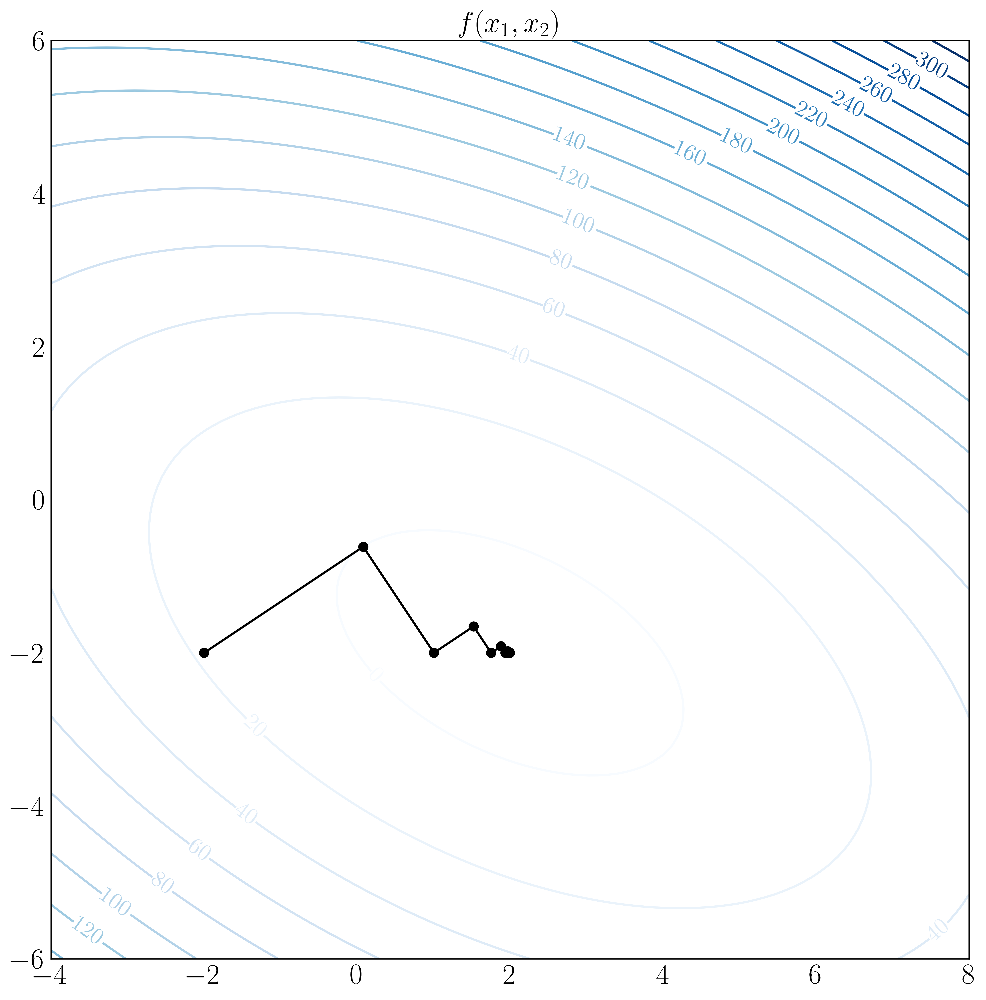

In [199]:
plot_steps(A, b, 4, -4, 8, -6, 6, 100, steps)
steps

### 一次迭代的过程

1. 跑动方向

b:
 [[ 2]
 [-8]]
A:
 [[3 2]
 [2 6]]
x:
 [[-2.]
 [-2.]]
r:
 [[12.]
 [ 8.]]
[[0.83205029]
 [0.5547002 ]]


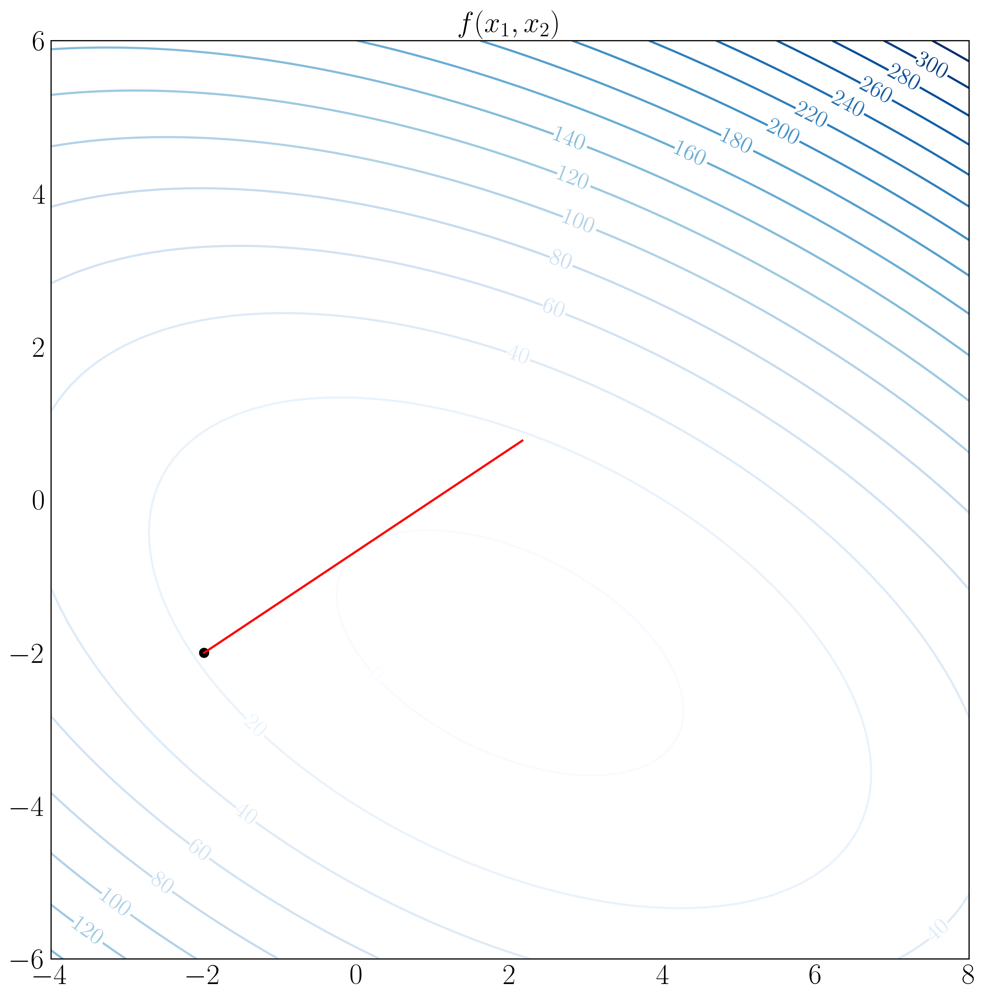

array([[12.],
       [ 8.]])

In [200]:
x = np.array([[-2.0],[-2.0]])
steps = [(-2.0,-2.0)]
i = 0
imax = 10
print('b:\n', b)
print('A:\n', A)
print('x:\n', x)
r = b - A @ x
print('r:\n', r)
normalized_r = r / np.linalg.norm(r)
print(normalized_r)
plot_steps(A, b, 4, -4, 8, -6, 6, 100, steps)
plt.plot([-2, -2 + 5*normalized_r[0, 0]], [-2, -2 + 5*normalized_r[1, 0]], 'r')
plt.show()
r

2. 跑多远

In [201]:
α = r.T @ r / (r.T @ A @ r)
α

array([[0.17333333]])

In [202]:
r = b - A @ x
r


array([[12.],
       [ 8.]])

In [203]:
x += α * r
x

array([[ 0.08      ],
       [-0.61333333]])

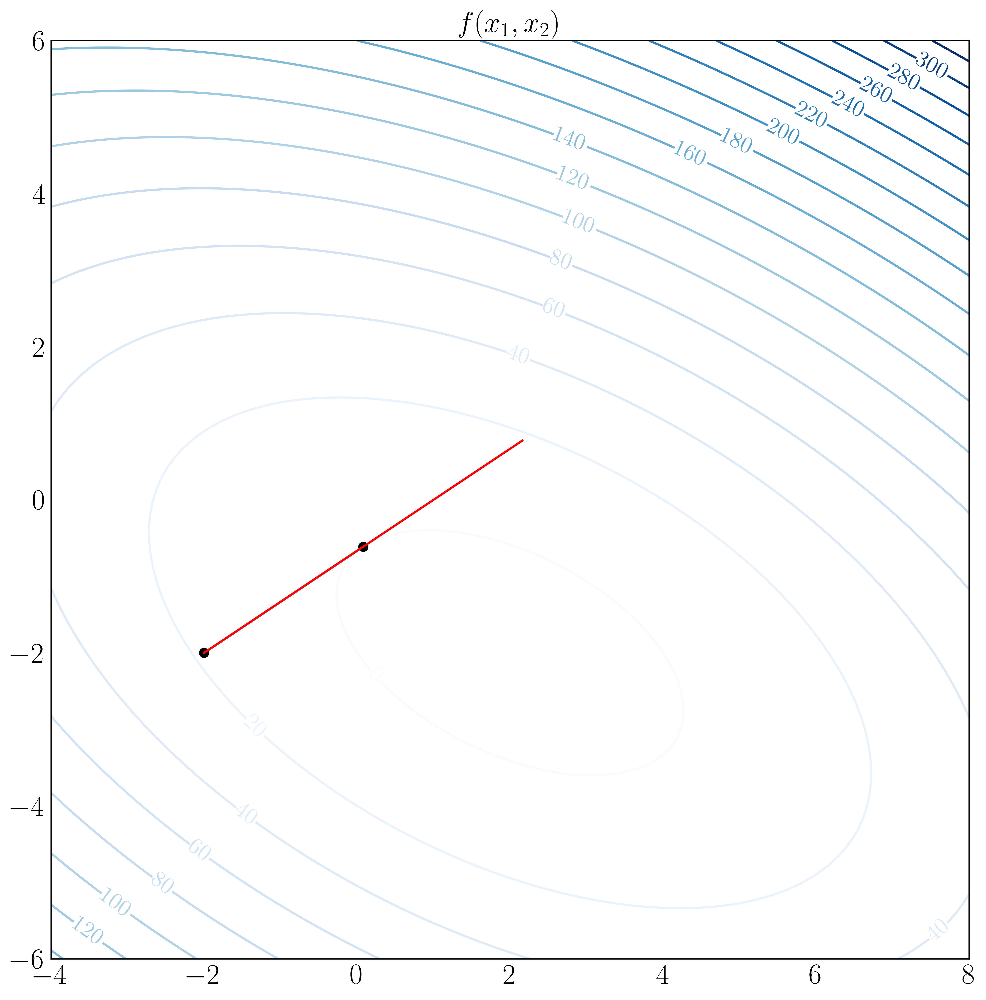

In [204]:
plot_steps(A, b, 4, -4, 8, -6, 6, 100, [(-2, -2), (x[0, 0], x[1, 0])])
plt.plot([-2, -2 + 5*normalized_r[0, 0]], [-2, -2 + 5*normalized_r[1, 0]], 'r')
plt.show()

3. 换方向跑

[[ 2.98666667]
 [-4.48      ]]


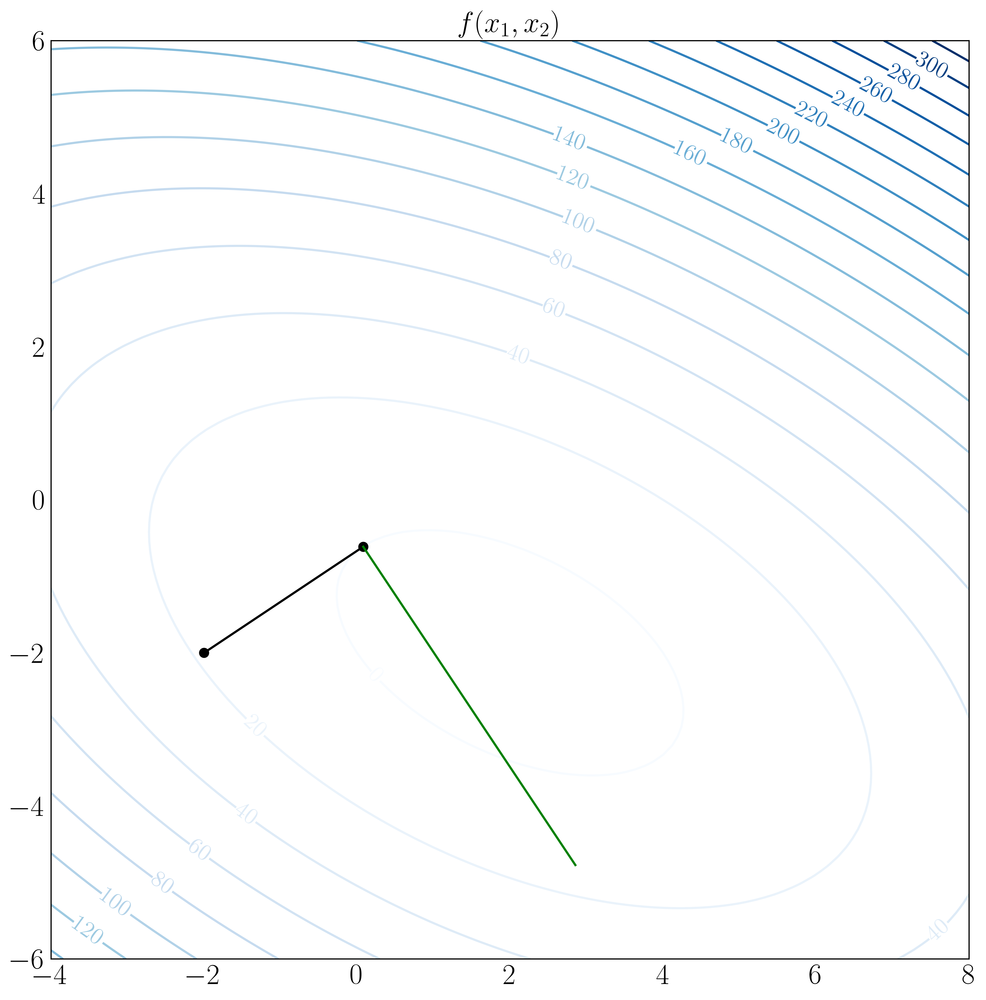

0.08000000000000007

In [205]:
r = b - A @ x
print(r)
normalized_r = r / np.linalg.norm(r)
plot_steps(A, b, 4, -4, 8, -6, 6, 100, [(-2, -2), (x[0, 0], x[1, 0])])
plt.plot([x[0, 0], x[0, 0]+5*normalized_r[0, 0]], [x[1, 0], x[1, 0]+5*normalized_r[1, 0]], 'g')
plt.show()
x[0, 0]

### 梯度下降

如果每次计算 𝛼
 都可以随便改变，则迭代速度会加快

In [206]:
A = np.array([[3,2],[2,6]])
x = np.array([[-2.0],[-2.0]])
steps = [(-2.0, -2.0)]
i = 0
imax = 10000
eps = 0.01
alpha = 0.1  # 尝试一下改变alpha值0.05, 0.27 and 0.3
r = b - A @ x
delta = r.T @ r
delta0 = delta
while i < imax and delta > eps**2 * delta0:
    x = x + alpha * r
    steps.append((x[0,0], x[1,0]))  # store steps for future drawing
    r = b - A @ x
    delta = r.T @ r
    i += 1
i

18

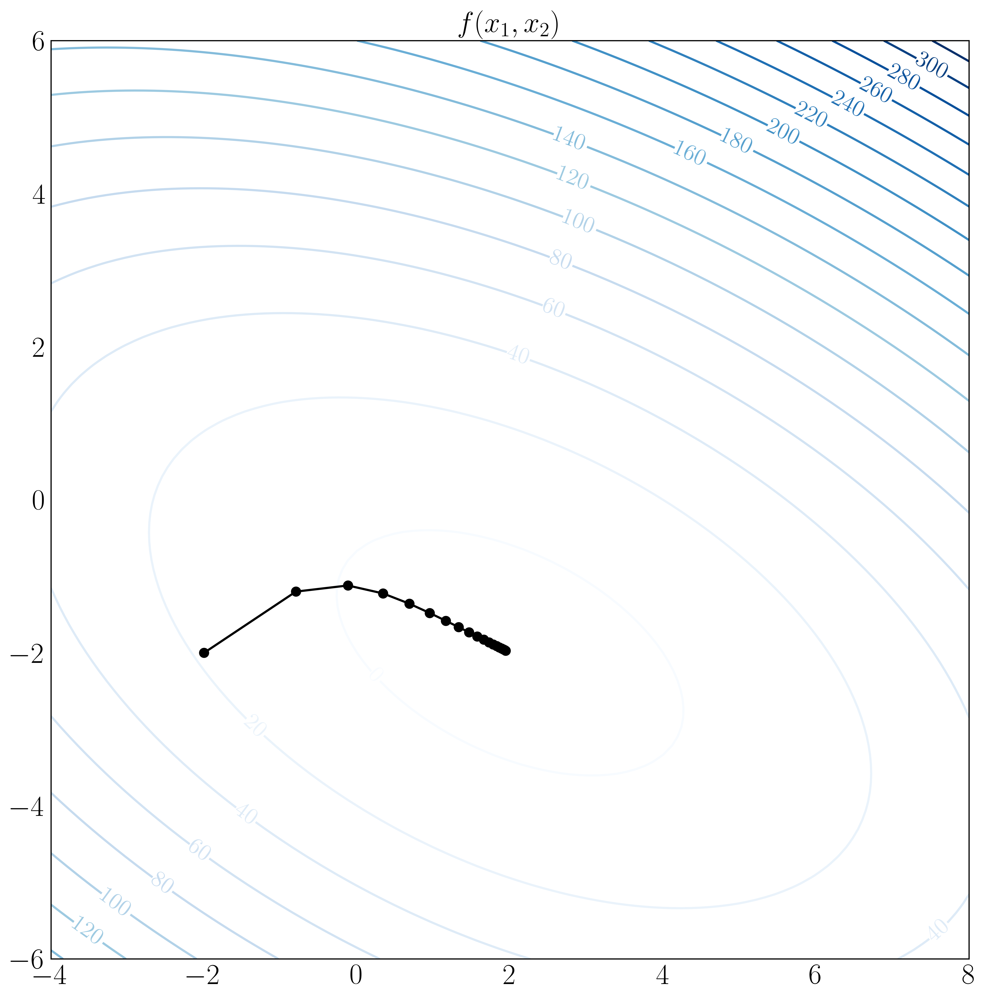

In [207]:
plot_steps(A, b, 4, -4, 8, -6, 6, 100, steps)

### 共轭方向

观察发现，最速下降算法的方向改变的规律.

### 共轭
A-orthogonal向量，这里的A就是我们求解的系数矩阵 𝐴𝑥=𝑏

In [208]:
def f(x, A, b, c):
    """
    description: 
    
    x is 
    A is 
    b is 
    c is 
    return is
    """
    return (0.5 * x.T * A * x - b.T * x + c)

def bowl(A, b, c, size=20):
    fig = plt.figure(figsize=(10,8), dpi = 300)
    ax = fig.add_subplot(projection='3d')
    x1, x2 = np.meshgrid(np.linspace(-6, 6, size), np.linspace(-6, 6, size))
    zs = np.zeros((size, size))
    for i in range(size):
        for j in range(size):
            x = np.matrix([[x1[i,j]], [x2[i,j]]])
            zs[i,j] = f(x, A, b, c)
    ax.plot_surface(x1, x2, zs, rstride=1, cstride=1, cmap=cm.jet, lw=1)
    return x1, x2, zs

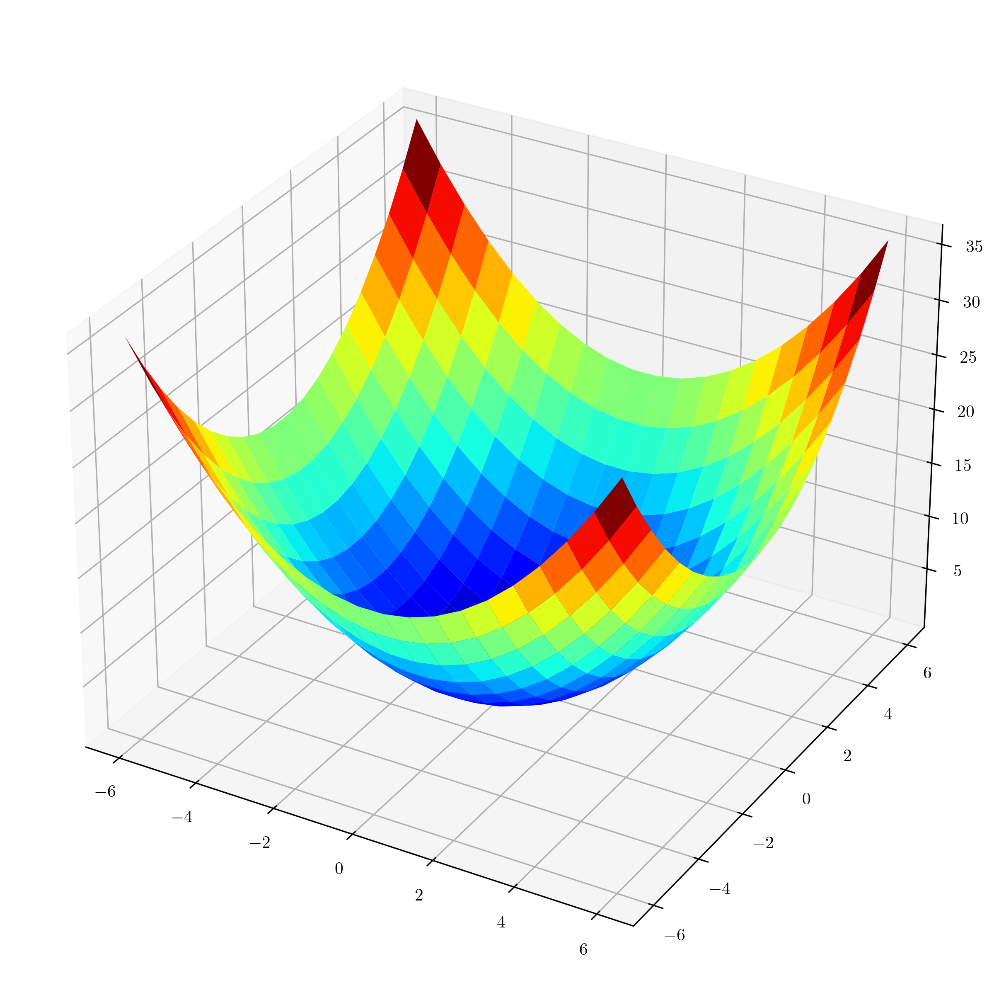

In [209]:
Acg = np.matrix([[1, 0], [0, 1]])
bcg = np.matrix([[0], [0]])
ccg = 0
x1, x2, zs = bowl(Acg, bcg, ccg)

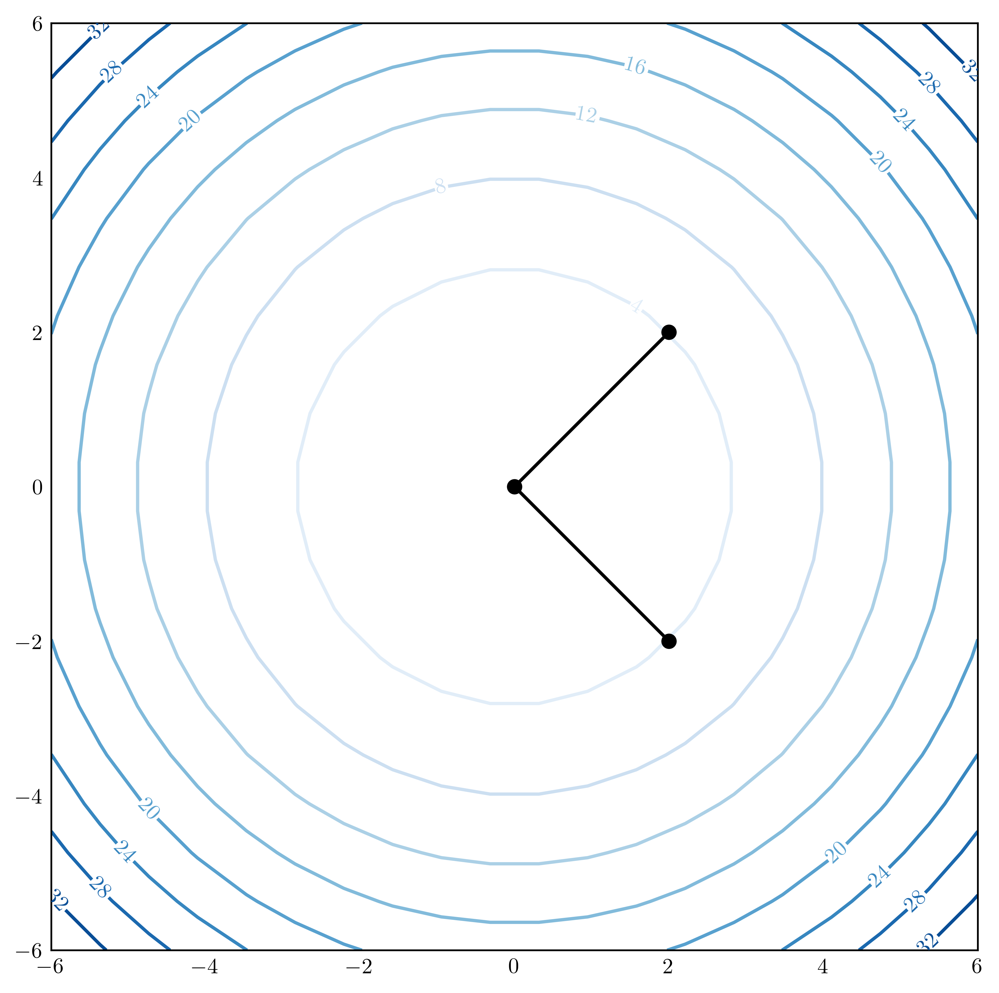

In [210]:
vector1 = np.matrix([[2],[2]])
vector2 = np.matrix([[2],[-2]])
contoursteps(x1, x2, zs, [(vector1[0,0],vector1[1,0]),(0,0),(vector2[0,0],vector2[1,0])])

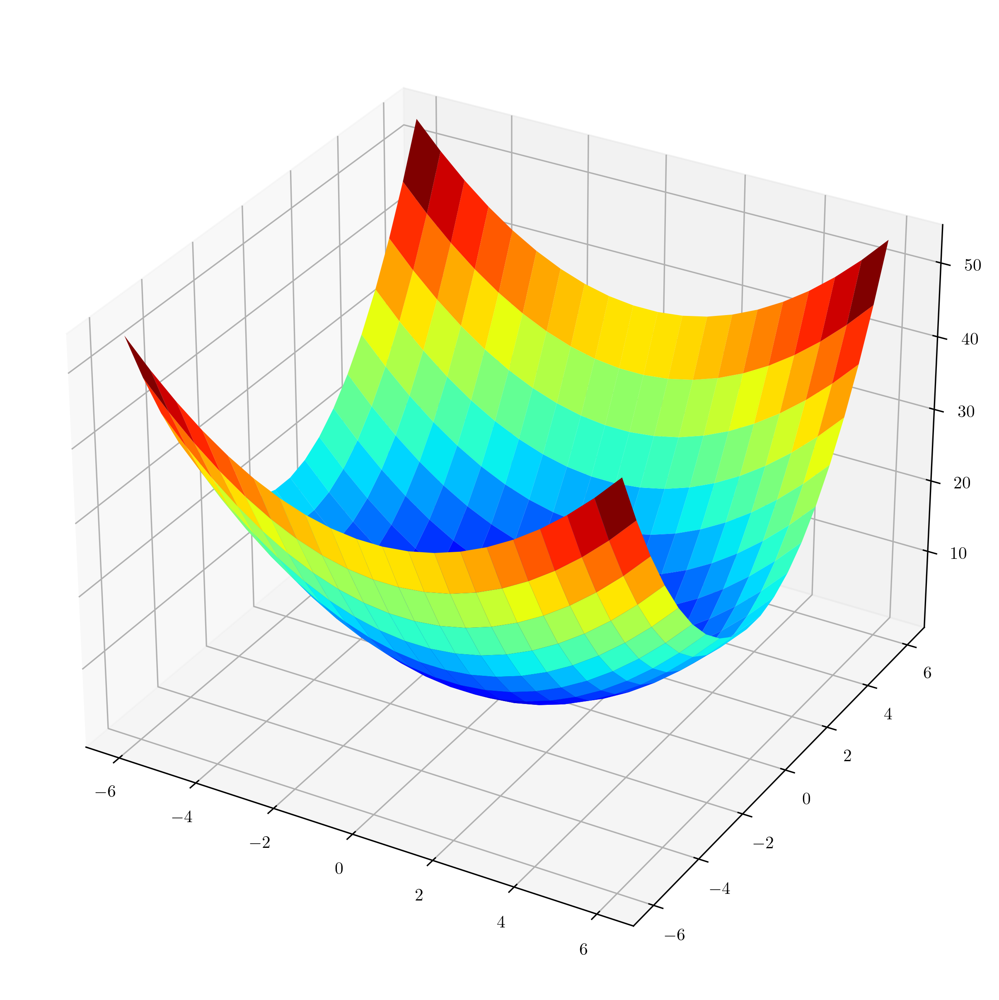

In [211]:
Ascaled = np.matrix([[1, 0],[0, 2]])
bscaled = np.matrix([[0],[0]])
cscaled = 0
x1, x2, zs = bowl(Ascaled, bscaled, cscaled)

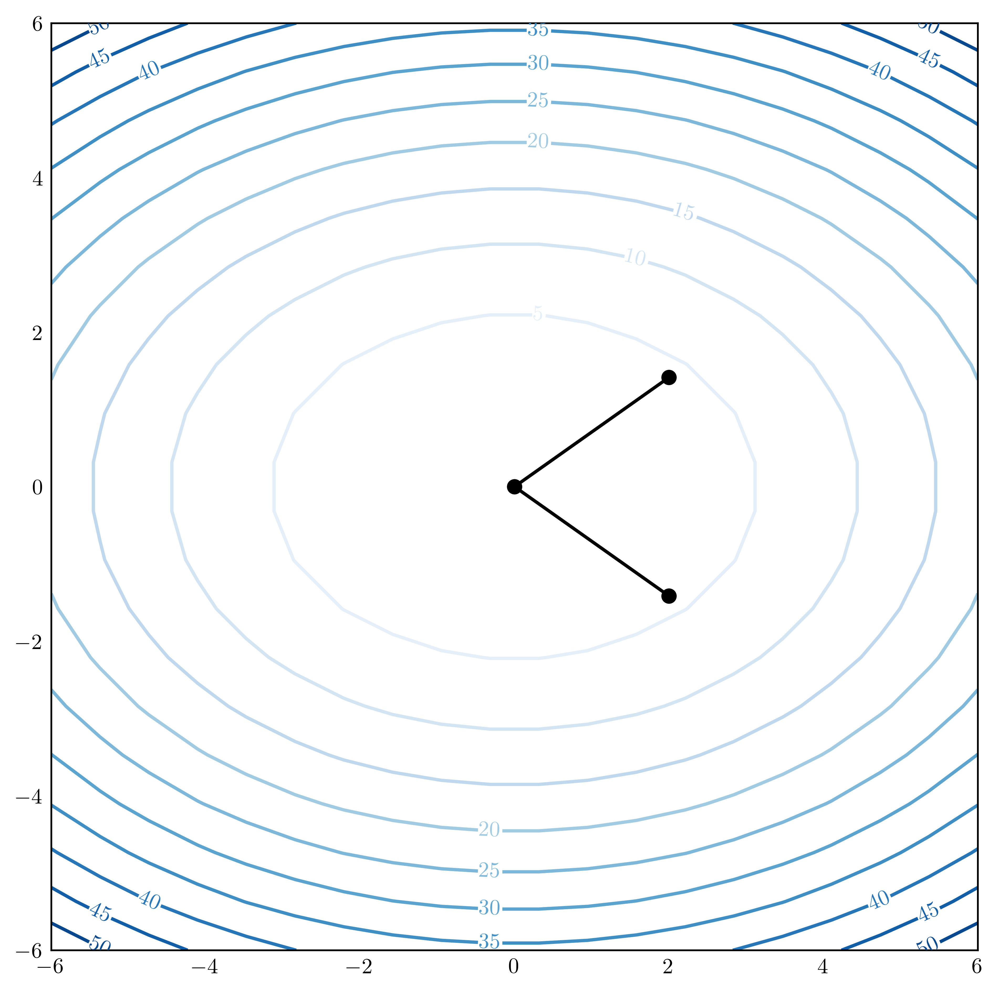

In [212]:
vector1 = np.matrix([[2],[np.sqrt(2)]])
vector2 = np.matrix([[2],[-np.sqrt(2)]])
contoursteps(x1, x2, zs, [(vector1[0,0],vector1[1,0]),(0,0),(vector2[0,0],vector2[1,0])])

但是它们关于矩阵A正交

In [213]:
vector1.T * Ascaled * vector2

matrix([[-5.46864693e-16]])

向量a和b关于矩阵A正交或者共轭

$$
a^T A b = 0
$$

可以想象在一个平板上，有两个向量正交，然后你把这个板子拉变形之后，向量$a$和向量$b$不再正交，但是他们关于矩阵$A$是正交

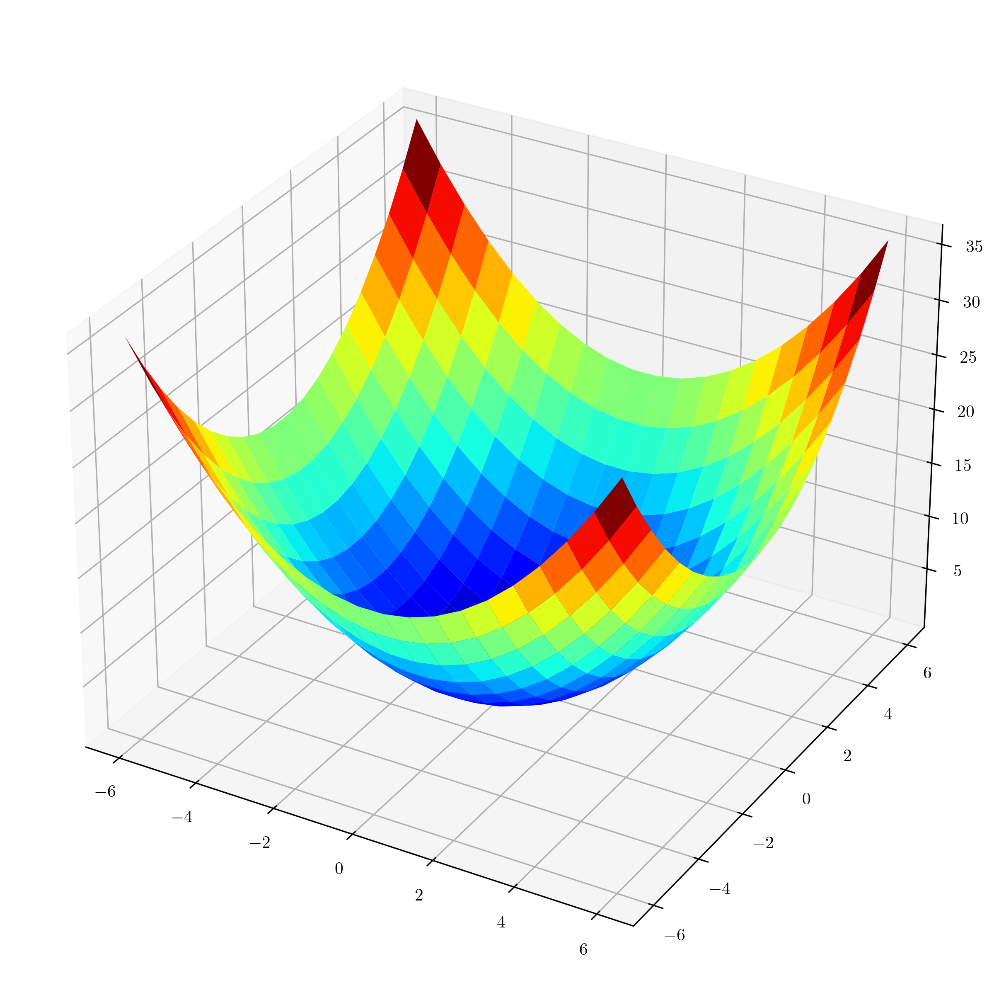

In [214]:
A = np.matrix([[1, 0],[0, 1]])
b = np.matrix([[0],[0]])
c = 0
x1, x2, zs = bowl(A, b, c)

In [215]:
x = np.matrix([[-2.0],[-2.0]])
steps = [(-2.0, -2.0)]
i = 0
imax = 10
eps = 0.01
r = b - np.matrix([[1, 0],[0, 0]]) * x  # 强迫r在x平行的方向跑
delta = r.T * r
delta0 = delta
while i < imax and delta > eps**2 * delta0:
    alpha = float(delta / (r.T * (A * r)))
    x = x + alpha * r
    steps.append((x[0,0], x[1,0]))  # 画图用
    r = b - A * x
    delta = r.T * r
    i += 1

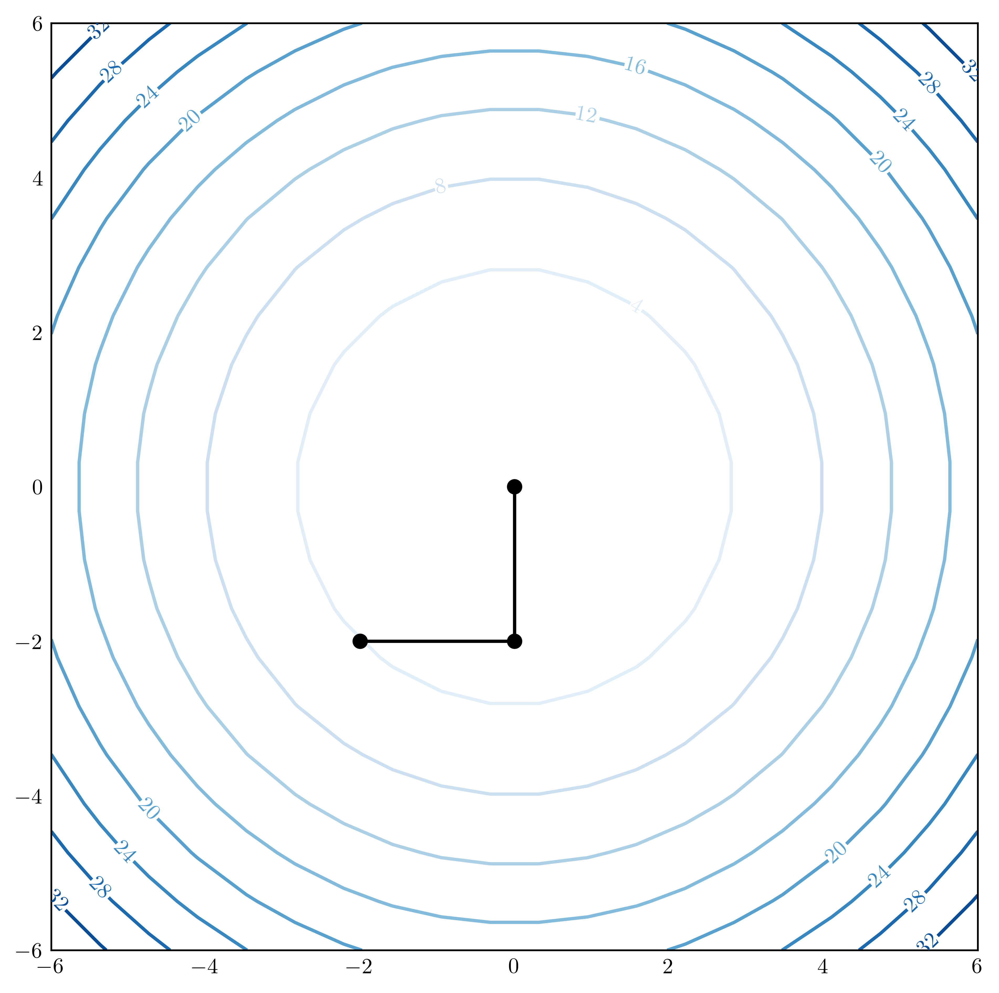

In [216]:
contoursteps(x1, x2, zs, steps)

### Gram-Schmidt Conjugation

我们需要n个共轭方向。使用`Gram-Schmidt`方法，可以得到我们想要的。[Gilbert Strang 18.06, P16](https://www.bilibili.com/video/BV1iU4y1K7oZ?p=16&vd_source=ba555841138e937cf05a48c0a0656561)
### The Method of Conjugate Gradients

2

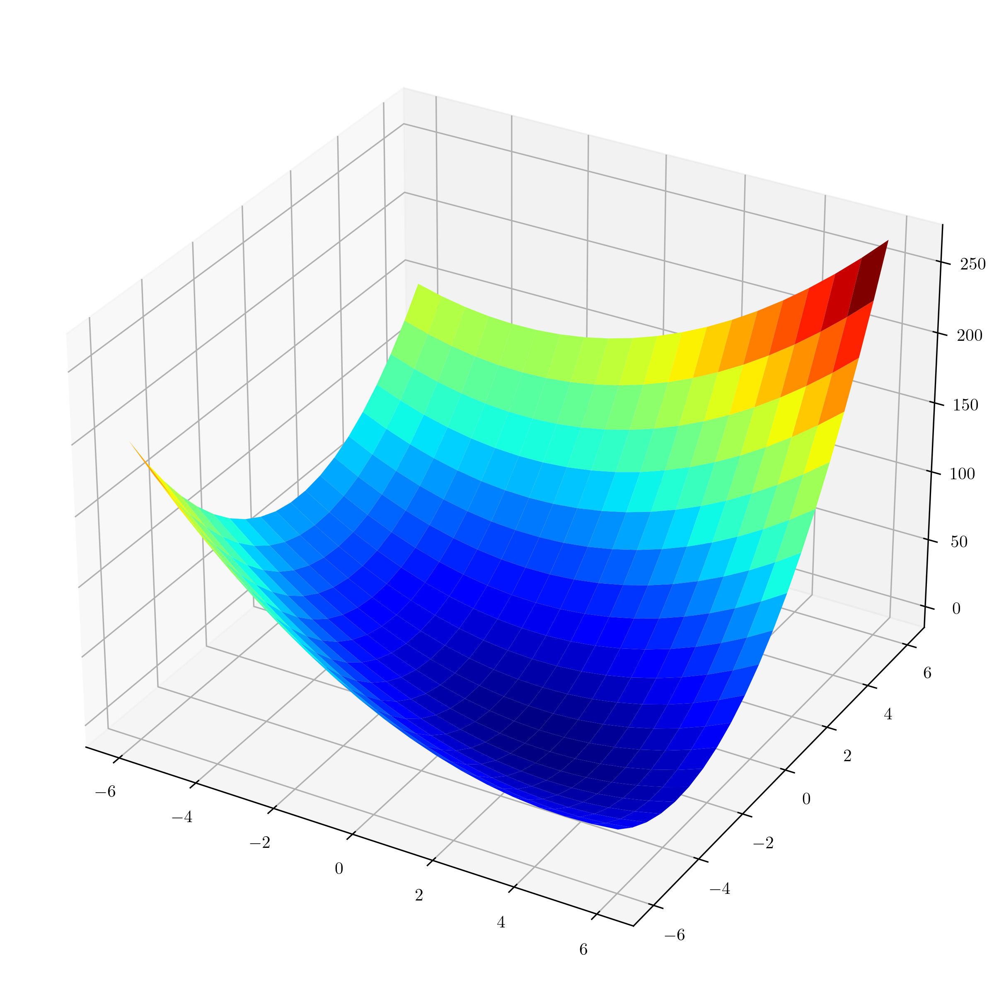

In [217]:
A = np.matrix([[3.0, 2.0], [2.0, 6.0]])
b = np.matrix([[2.0], [-8.0]])
c = 0.0
x = np.matrix([[-2.0],[-2.0]])
x1, x2, zs = bowl(A, b, c)
steps = [(-2.0, -2.0)]
i = 0
imax = 10
eps = 0.01
r = b - A * x # 第0步的残差，residual r = b - A * x, error = x^{k+1} - x^{k} Ae = r
d = r         # 最开始的时候这两个方向是相同的
deltanew = r.T * r
delta0 = deltanew
while i < imax and deltanew > eps**2 * delta0:
    alpha = float(deltanew / float(d.T * A * d))
    x = x + alpha * d
    steps.append((x[0, 0], x[1, 0]))
    r = b - A * x
    deltaold = deltanew
    deltanew = r.T * r
    beta = float(deltanew / float(deltaold))
    d = r + beta * d
    i += 1

i 

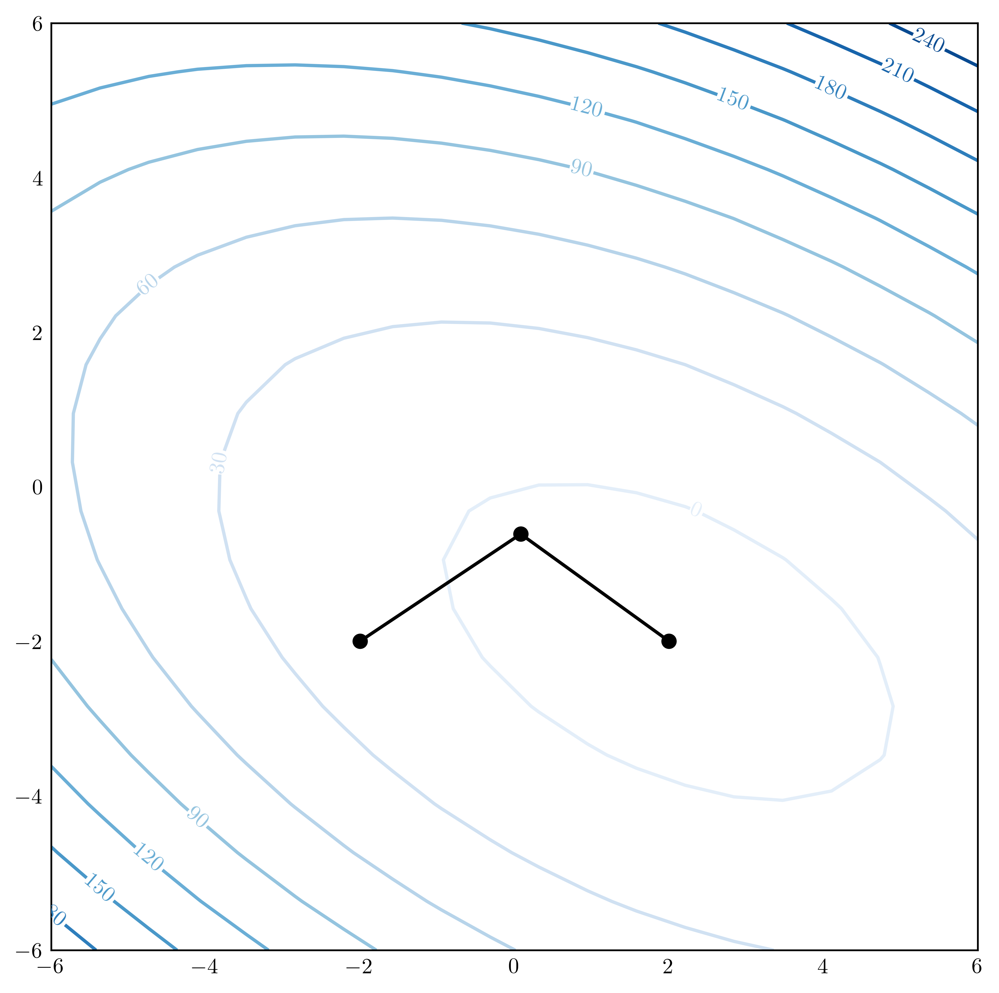

In [218]:
contoursteps(x1, x2, zs, steps)

你会发现，2次迭代就跑完了。

跟最速下降算法比较，其实算法没有太多改变。

```python
    beta = float(deltanew / float(deltaold))
    d = r + beta * d
```

#### 第一步迭代

In [219]:
x = np.matrix([[-2.0],[-2.0]])
steps = [(-2.0, -2.0)]
i = 0
imax = 10
eps = 0.01
r = b - A * x
d = r
deltanew = r.T * r
delta0 = deltanew


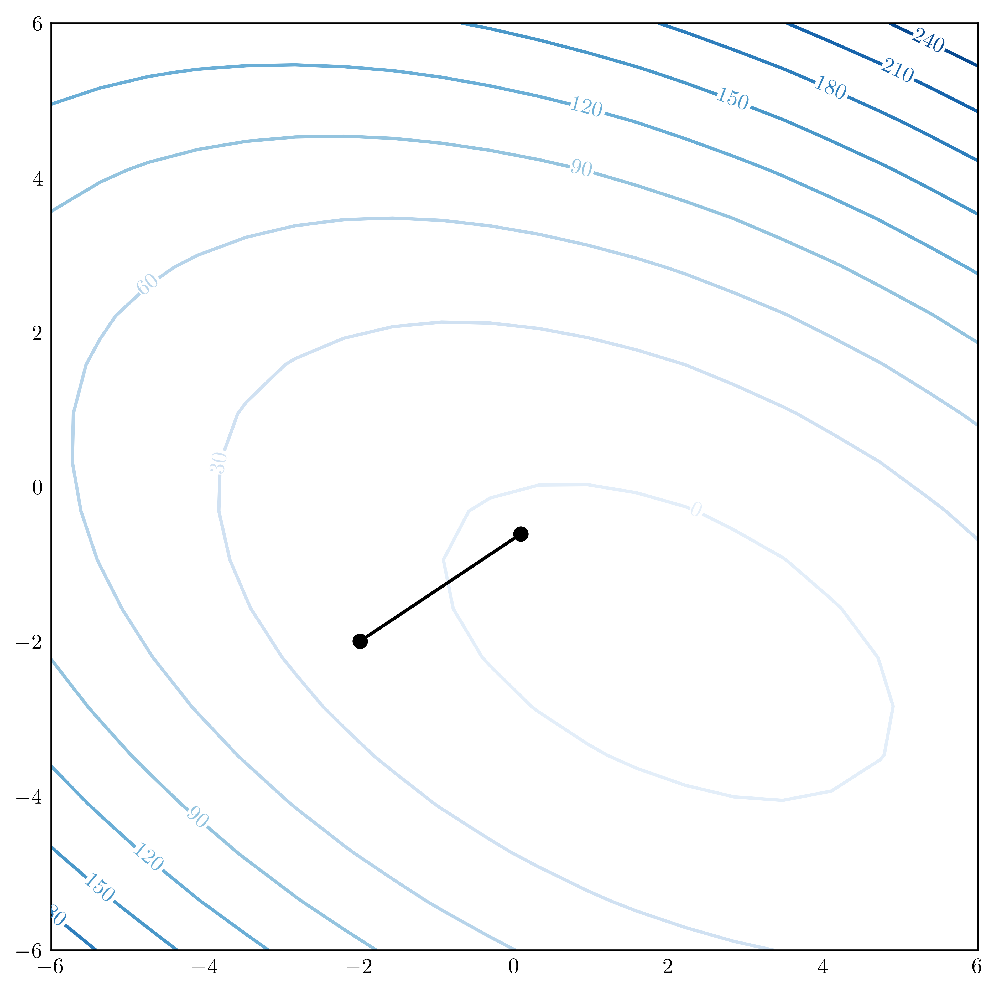

In [220]:
alpha = float(deltanew / float(d.T * (A * d)))
x = x + alpha * d
steps.append((x[0, 0], x[1, 0]))
contoursteps(x1, x2, zs, steps)

计算第一次迭代的误差

In [221]:
r = b - A * x

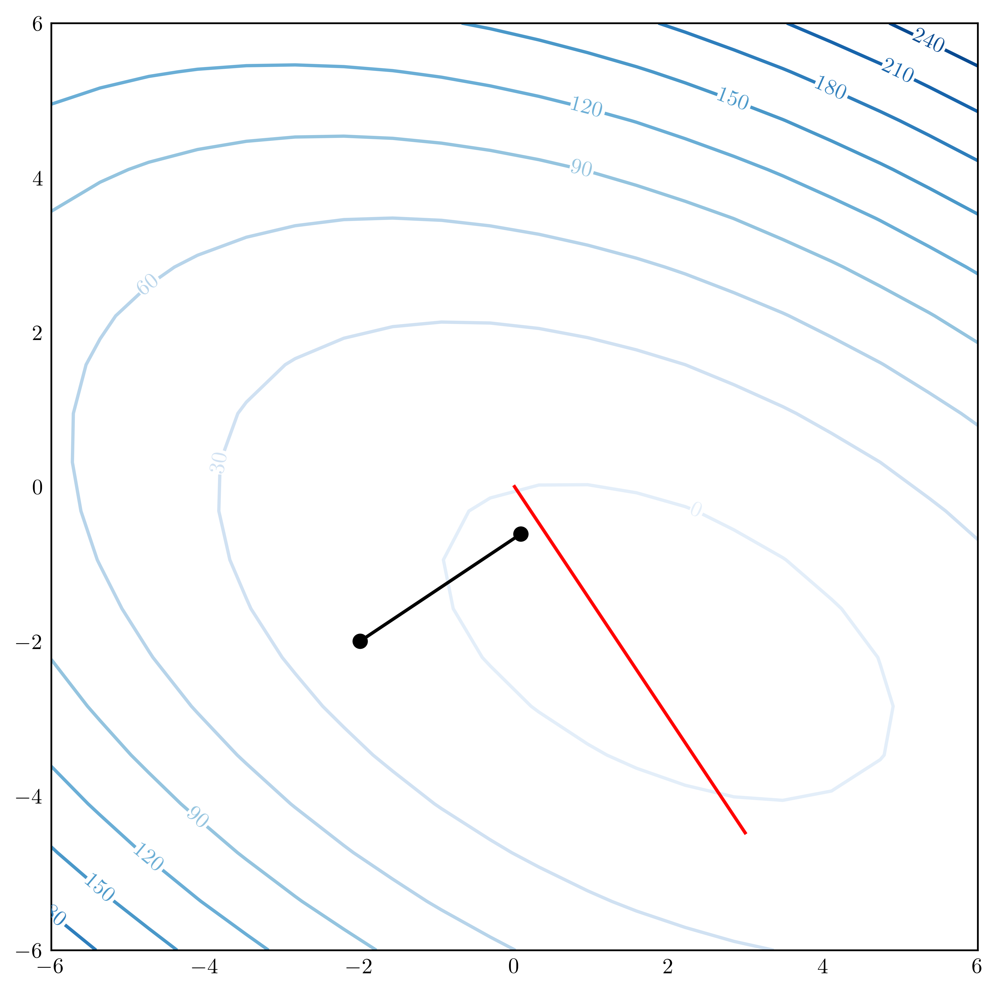

In [222]:
contoursteps(x1, x2, zs, [(-2, -2), (x[0,0],x[1,0])])
plt.plot([0, r[0, 0]], [0, r[1, 0]], 'r')
plt.show()

这个时候要计算共轭量

In [223]:
d.T * A * r

matrix([[-167.25333333]])

In [224]:
deltaold = deltanew
deltanew = r.T * r
beta = float(deltanew / float(deltaold))

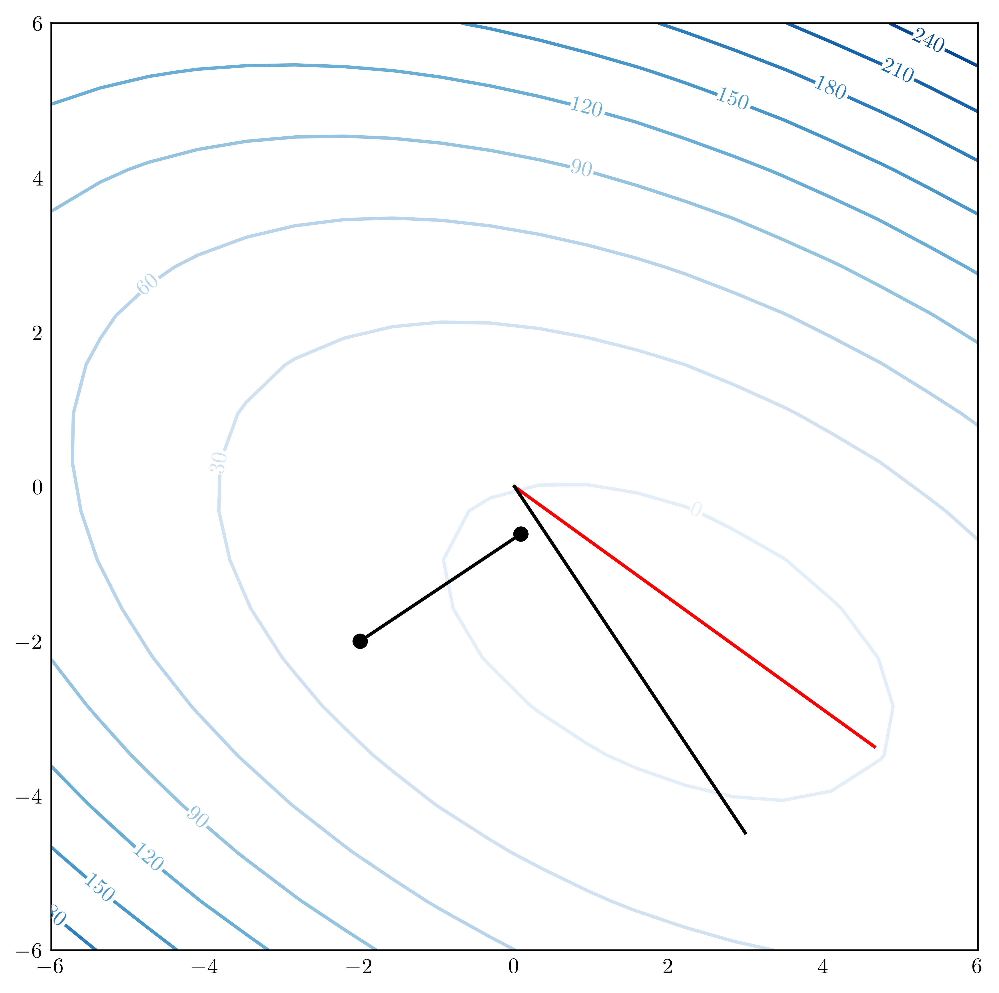

In [225]:
dold = d 
d = r + beta * d # 这里的beta是新的向量关系
contoursteps(x1, x2, zs, [(-2, -2), (x[0,0],x[1,0])])
plt.plot([0,d[0,0]], [0, d[1,0]], 'r')  # 新方向
plt.plot([0,r[0,0]], [0, r[1,0]], 'k')  # 老方向 (residual)
plt.show()

In [226]:
d.T * A * oldd

matrix([[0.]])

$$
\beta = \frac{r^{T(i)}r^{T(i)}}{r^{T(i-1)}r^{T(i-1)}}
$$

具体细节看[painless-conjuagate-gradient.pdf](http://www.cs.cmu.edu/~quake-papers/painless-conjugate-gradient.pdf)，如果想彻底理解请认真学习线性代数[Gilber Strang 18.06](https://www.bilibili.com/video/BV1iU4y1K7oZ?spm_id_from=333.999.0.0)

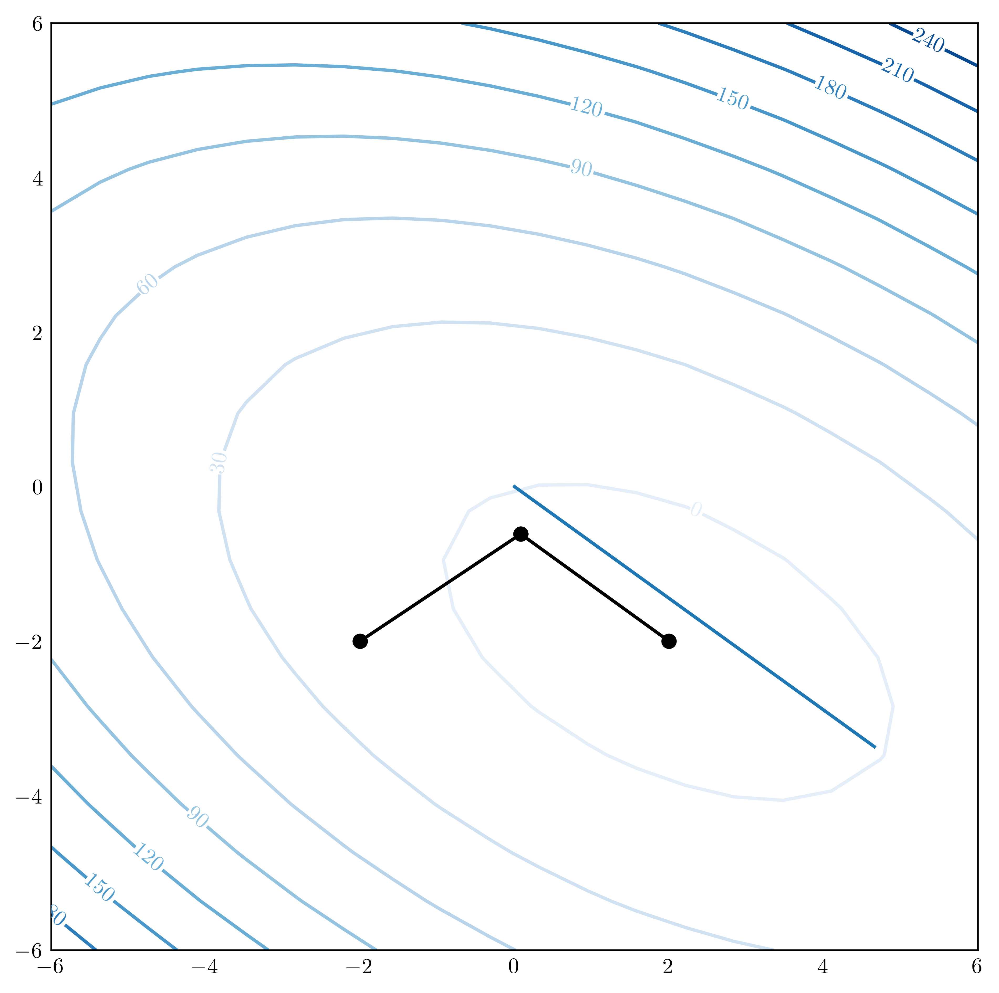

In [227]:
alpha = float(deltanew / float(d.T * (A * d)))
x = x + alpha * d
steps.append((x[0, 0], x[1, 0]))
contoursteps(x1, x2, zs, steps)
plt.plot([0,d[0,0]], [0, d[1,0]])
plt.show()

$$
d^0 = r^0 = b - Ax^0\\
\alpha^i=\dfrac{r'^ir'}{d'^iAd^i}\\
x^{i+1}=x^i+\alpha^id^i\\
r^{i+1}=r^i-\alpha^iAd^i\\
\beta^{i+1}=\dfrac{r'^{i+1}{r^{i+1}}}{r'^ir^i}\\
d^{i+1}=r^{i+1}+\beta^{i+1}d^i
$$

1. [CG](https://en.wikipedia.org/wiki/Conjugate_gradient_method)
2. [BiCG](https://en.wikipedia.org/wiki/Biconjugate_gradient_method)，不怎么用
3. [BiCGStab](https://en.wikipedia.org/wiki/Biconjugate_gradient_stabilized_method)
4. [OpenFOAM Notes on Computational Fluid Dynamics: General Principles](https://doc.cfd.direct/notes/cfd-general-principles/preconditioning-and-asymmetry)，预条件和非对称矩阵